 ### 📞 **Прогнозирование оттока клиентов для телеком-компании.**


 **Задача**   
    Оператор связи «Ниединогоразрыва.ком» хочет научиться прогнозировать отток клиентов. Если выяснится, что пользователь планирует уйти, ему будут предложены промокоды и специальные условия. Команда оператора собрала персональные данные о некоторых клиентах, информацию об их тарифах и договорах.

 **Описание услуг**

Оператор предоставляет два основных типа услуг: 

1. Стационарную телефонную связь. Возможно подключение телефонного аппарата к нескольким линиям одновременно.
2. Интернет. Подключение может быть двух типов: через телефонную линию (DSL*,* от англ. *digital subscriber line*, «цифровая абонентская линия») или оптоволоконный кабель (*Fiber optic*).  

Также доступны такие услуги:

- Интернет-безопасность: антивирус (*DeviceProtection*) и блокировка небезопасных сайтов (*OnlineSecurity*);
- Выделенная линия технической поддержки (*TechSupport*);
- Облачное хранилище файлов для резервного копирования данных (*OnlineBackup*);
- Стриминговое телевидение (*StreamingTV*) и каталог фильмов (*StreamingMovies*).

За услуги клиенты могут платить каждый месяц или заключить договор на 1–2 года. Доступны различные способы расчёта и возможность получения электронного чека.

**Описание данных**

Данные состоят из файлов, полученных из разных источников:

- `contract.csv` — информация о договоре;
- `personal.csv` — персональные данные клиента;
- `internet.csv` — информация об интернет-услугах;
- `phone.csv` — информация об услугах телефонии.

Во всех файлах столбец `customerID` содержит код клиента.

Информация о договорах актуальна на 1 февраля 2020.

In [1]:
!pip install catboost 
!pip install statsmodels
!pip install xgboost
!pip install lightgbm
!pip install shap

In [2]:
# блок импорта
import warnings
warnings.simplefilter('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
import statsmodels as sm
import plotly
import plotly.graph_objs as go
import plotly.express as px
import shap
shap.initjs()
import logging
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)
import seaborn as sns
sns.set_theme(style="ticks")

# Графики
from plotly.subplots import make_subplots

# Подготовка моделей
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn.dummy import DummyClassifier

# Модели
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# Метрики
from sklearn.metrics import *

# CatBoost
from catboost import CatBoostClassifier, Pool, cv as catboost_cv

#lightgbm
from lightgbm import LGBMClassifier

## **Загрузка и обзор данных**


In [3]:
contract = pd.read_csv('C:/Users/User/Desktop/contract.csv')
personal = pd.read_csv('C:/Users/User/Desktop/personal.csv')
internet = pd.read_csv('C:/Users/User/Desktop/internet.csv')
phone = pd.read_csv('C:/Users/User/Desktop/phone.csv')

In [4]:
def data_info(data, name):
    shape_data = data.shape
    data_describe = data.describe().T
    data_numeric=data._get_numeric_data()
    data_null = data_numeric.isnull().sum()/len(data) * 100
    data_describe['Missing %']=data_null
    print(50*"-"+name.upper()+50*"-")
    print('Количество строк, столбцов в ' + name + ':', shape_data)
    print('Обзор данных', '\n')
    display(data.sample(10))
    print('Информация о датасете', '\n')
    display(data.info())
    print('Cтатистика', '\n')
    display(data_describe)

##  **Сontract - информация о договоре**


In [5]:
contract['TotalCharges'] = contract['TotalCharges'].replace(' ', 0)
contract['TotalCharges'] = pd.to_numeric(contract['TotalCharges'])
contract['BeginDate'] = pd.to_datetime(contract['BeginDate'])
data_info(contract, 'contract')

--------------------------------------------------CONTRACT--------------------------------------------------
Количество строк, столбцов в contract: (7043, 8)
Обзор данных 



,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
676,2324-AALNO,2016-02-01,No,One year,No,Bank transfer (automatic),24.55,1203.95
2240,3398-GCPMU,2014-02-01,No,Two year,Yes,Credit card (automatic),89.55,6448.85
6280,0489-WMEMG,2018-03-01,No,One year,Yes,Electronic check,49.45,1119.35
4337,2674-MLXMN,2014-03-01,No,Month-to-month,Yes,Credit card (automatic),99.65,6951.15
3980,8868-WOZGU,2017-08-01,2019-12-01 00:00:00,Month-to-month,Yes,Electronic check,105.70,2979.50
6187,0224-NIJLP,2019-06-01,No,Two year,No,Mailed check,20.15,165.50
5141,0303-WMMRN,2019-09-01,No,Month-to-month,Yes,Mailed check,19.25,86.05
7018,1122-JWTJW,2019-10-01,2019-11-01 00:00:00,Month-to-month,Yes,Mailed check,70.65,70.65
5651,4471-KXAUH,2016-04-01,2019-10-01 00:00:00,Month-to-month,Yes,Electronic check,84.30,3588.40
2108,0842-IWYCP,2016-04-01,No,Month-to-month,No,Bank transfer (automatic),44.95,2168.90


Информация о датасете 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   customerID        7043 non-null   object        
 1   BeginDate         7043 non-null   datetime64[ns]
 2   EndDate           7043 non-null   object        
 3   Type              7043 non-null   object        
 4   PaperlessBilling  7043 non-null   object        
 5   PaymentMethod     7043 non-null   object        
 6   MonthlyCharges    7043 non-null   float64       
 7   TotalCharges      7043 non-null   float64       
dtypes: datetime64[ns](1), float64(2), object(5)
memory usage: 440.3+ KB


None

Cтатистика 



,count,mean,std,min,25%,50%,75%,max,Missing %
MonthlyCharges,7043.0,64.761692,30.090047,18.25,35.50,70.35,89.85,118.75,0.0
TotalCharges,7043.0,2279.734304,2266.794470,0.00,398.55,1394.55,3786.60,8684.80,0.0


 Датасет содержит 7043 объекта и 7 признаков.  

Попытаемся описать признаки:
- *BeginDate* - дата начала контракта;
- *EndDate* - дата окончания контракта (при наличии);
- *Type* - тип контракта (оплата каждый месяц/на год-два вперед);
- *PaperlessBilling* - электронный чек;
- *PaymentMethod* - способ расчета;
- *MonthlyCharges* - месячная стоимость контракта;
- *TotalCharges* - общая стоимость контракта за все время.  
    
На данном этапе пропуски не обнаружены. Обнаружены некорректные типы данных для столбцов BeginDate и TotalCharges. Заменим типы данных сразу, т.к. это может помешать дальнейшему анализу.




## **Personal — персональные данные клиента**


In [6]:
data_info(personal, 'personal')

--------------------------------------------------PERSONAL--------------------------------------------------
Количество строк, столбцов в personal: (7043, 5)
Обзор данных 



,customerID,gender,SeniorCitizen,Partner,Dependents
5933,6496-SLWHQ,Male,1,No,No
7016,1471-GIQKQ,Female,0,No,No
549,8138-EALND,Male,0,No,No
996,6641-XRPSU,Female,0,No,No
4007,1073-XXCZD,Male,0,Yes,No
7012,6691-CCIHA,Female,0,Yes,No
2279,5334-AFQJB,Male,1,No,No
4304,9732-OUYRN,Female,0,Yes,No
1765,0409-WTMPL,Female,0,Yes,No
3803,2533-QVMSK,Male,0,Yes,No


Информация о датасете 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     7043 non-null   object
 1   gender         7043 non-null   object
 2   SeniorCitizen  7043 non-null   int64 
 3   Partner        7043 non-null   object
 4   Dependents     7043 non-null   object
dtypes: int64(1), object(4)
memory usage: 275.2+ KB


None

Cтатистика 



,count,mean,std,min,25%,50%,75%,max,Missing %
SeniorCitizen,7043.0,0.162147,0.368612,0.0,0.0,0.0,0.0,1.0,0.0


  Датасет содержит 7043 объекта и 4 признака.  

Попытаемся описать признаки:
- *gender* - пол клиента;
- *SeniorCitizen* - относится ли клиент к категории пенсионеров;
- *Partner* - необходимо уточнить, вероятно, наличие партнера;
- *Dependents* - необходимо уточнить значение.
    
На данном этапе пропуски не обнаружены. Все признаки категориальные.


##  **Internet — информация об интернет-услугах**


In [7]:
data_info(internet, 'internet')

--------------------------------------------------INTERNET--------------------------------------------------
Количество строк, столбцов в internet: (5517, 8)
Обзор данных 



,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
3675,5181-OABFK,DSL,Yes,Yes,Yes,No,No,No
5014,1422-DGUBX,Fiber optic,No,No,No,Yes,No,No
2511,7250-EQKIY,DSL,No,No,Yes,No,No,No
5458,5130-YPIRV,DSL,Yes,Yes,Yes,No,Yes,No
2953,8260-NGFNY,DSL,No,No,No,No,No,No
3993,5317-FLPJF,DSL,Yes,No,Yes,Yes,Yes,Yes
3406,2675-OTVVJ,Fiber optic,Yes,No,No,No,Yes,No
3734,0511-JTEOY,Fiber optic,No,No,No,No,No,No
637,5173-WXOQV,DSL,No,Yes,No,Yes,No,Yes
3411,0537-QYZZN,Fiber optic,Yes,No,No,No,No,No


Информация о датасете 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 0 to 5516
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   customerID        5517 non-null   object
 1   InternetService   5517 non-null   object
 2   OnlineSecurity    5517 non-null   object
 3   OnlineBackup      5517 non-null   object
 4   DeviceProtection  5517 non-null   object
 5   TechSupport       5517 non-null   object
 6   StreamingTV       5517 non-null   object
 7   StreamingMovies   5517 non-null   object
dtypes: object(8)
memory usage: 344.9+ KB


None

Cтатистика 



,count,unique,top,freq,Missing %
customerID,5517,5517,5973-EJGDP,1,NaN
InternetService,5517,2,Fiber optic,3096,NaN
OnlineSecurity,5517,2,No,3498,NaN
OnlineBackup,5517,2,No,3088,NaN
DeviceProtection,5517,2,No,3095,NaN
TechSupport,5517,2,No,3473,NaN
StreamingTV,5517,2,No,2810,NaN
StreamingMovies,5517,2,No,2785,NaN


  Датасет содержит 5517 объектов и 7 признаков.
    
Тип интернет-подключения и статус подключения дополнительных интернет-услуг:    
- *InternetService* - тип подключения (телефонная линия (DSL)/оптоволоконный кабель (Fiber optic);
- *OnlineSecurity* - блокировка небезопасных сайтов;
- *OnlineBackup* - облачное хранилище файлов для резервного копирования данных;
- *DeviceProtection* - антивирус;
- *TechSupport* - выделенная линия технической поддержки;
- *StreamingTV* - стриминговое телевидение;
- *StreamingMovies* - каталог фильмов.
    
Пропуски не обнаружены. Размер этого датасета отличается от размера датасета с описанием клиентов, это может означать, что не все пользователи подключили интернет.


##  **Phone — информация об услугах телефонии**


In [8]:
data_info(phone, 'phone')

--------------------------------------------------PHONE--------------------------------------------------
Количество строк, столбцов в phone: (6361, 2)
Обзор данных 



,customerID,MultipleLines
1665,8496-EJAUI,No
603,7538-GWHML,No
5350,7881-INRLC,Yes
736,8098-TDCBU,Yes
3148,9576-SYUHJ,Yes
5482,2959-FENLU,No
3695,9938-TKDGL,No
4945,4012-YCFAI,No
2282,0679-TDGAK,No
3959,8430-TWCBX,No


Информация о датасете 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 0 to 6360
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     6361 non-null   object
 1   MultipleLines  6361 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB


None

Cтатистика 



,count,unique,top,freq,Missing %
customerID,6361,6361,5973-EJGDP,1,NaN
MultipleLines,6361,2,No,3390,NaN


 Датасет содержит 6361 объект и всего 1 признак:

- *MultipleLines* -  подключение телефонного аппарата к нескольким линиям одновременно.
    
Пропуски не обнаружены. Размер этого датасета отличается от размера датасета с описанием клиентов, это может означать, что не все пользователи пользуются телефонной линией.


## 📍  **Вывод**



 Данные успешно загружены. Рассмотрены 4 датасета с различной информацией: о заключенных контрактах, клиентах, услугах интернета и телефонии, подключенных к каждому контракту.

- Все датасеты содержат столбец customerID.  
- Пропуски не обнаружены.  
- Обнаружены различия в размерностях датасетов.
- Заменены типы данных для некоторых столбцов.
- Необходимо уточнить описание некоторых признаков.
  

## **Исследовательский анализ данных**


  Приведем все строки к нижнему регистру для повышения удобства работы с ними в процессе анализа данных.


In [9]:
def lower(data):
    data.columns = data.columns.str.lower()
    
    for i in range (len(data.columns)):
        if data.columns[i] != 'customerid':
            try:
                data[data.columns[i]] = data[data.columns[i]].str.lower()
            except:
                data[data.columns[i]] = data[data.columns[i]]
    return data

In [10]:
contract = lower(contract)
personal = lower(personal)
internet = lower(internet)
phone = lower(phone)

## **Баланс классов**


In [11]:
contract['churn'] = contract['enddate'].apply(lambda x: 'active_client' if x =='no' else 'gone_client')

In [12]:
fig = go.Figure(data=[go.Histogram(x=contract['churn'])])
fig.update_layout(
    title = 'Распределение целевого признака',
                   yaxis_title="Значение признака",
                   xaxis_title="Количество записей с соответствующим значением")
fig.show()

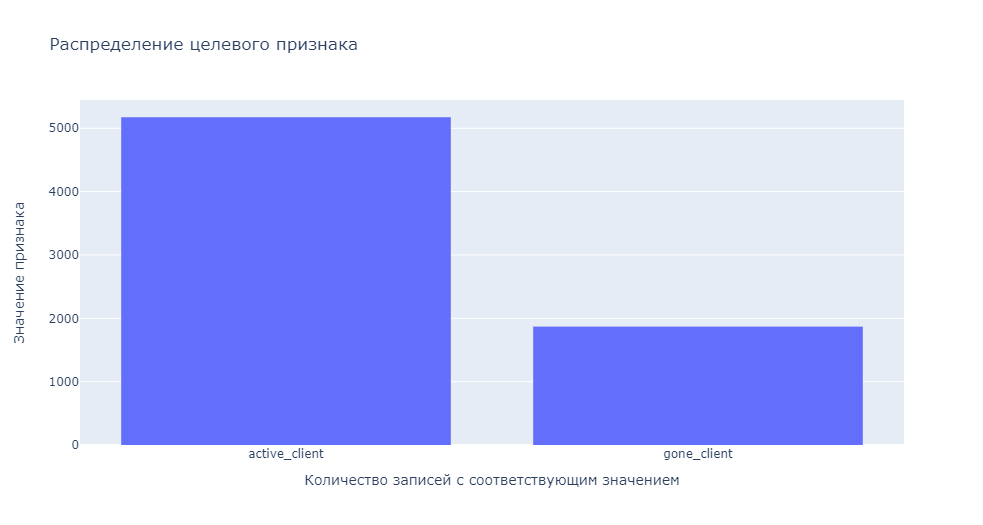

 Очевидный дисбаланс классов, однако, в необходимую сторону (клиенты остаются). 


## **Динамика изменения количества клиентов**


In [13]:
data_for_line = pd.DataFrame(contract.groupby('begindate')['totalcharges'].count())
data_for_line['begindate'] = data_for_line.index
fig = px.line(data_for_line, x="begindate", y="totalcharges")
fig.update_layout(
    title = 'Количество новых клиентов',
                   yaxis_title="Количество клиентов",
                   xaxis_title="Начало сотрудничества")
fig.show()

 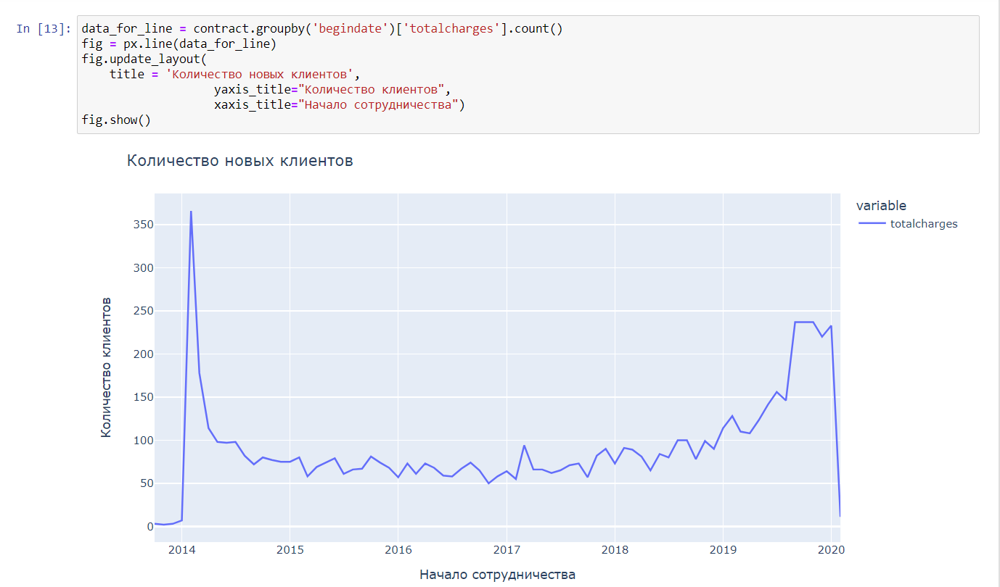


Пик продаж наблюдается в феврале 2014, посе этого продажи сильно возросли в сентябре 2019. Однако резкое падение в 2020 вызывает подозрения.


In [14]:
data_for_scatter = contract[contract['enddate'] != 'no']
data_for_scatter = pd.DataFrame(data_for_scatter.groupby('enddate')['totalcharges'].count())
data_for_scatter['enddate'] = data_for_scatter.index
fig = px.scatter(data_for_scatter, x="enddate", y="totalcharges")
fig.update_layout(
    title = 'Количество ушедших клиентов',
                   yaxis_title="Количество клиентов",
                   xaxis_title="Окончание сотрудничества")
fig.show()

 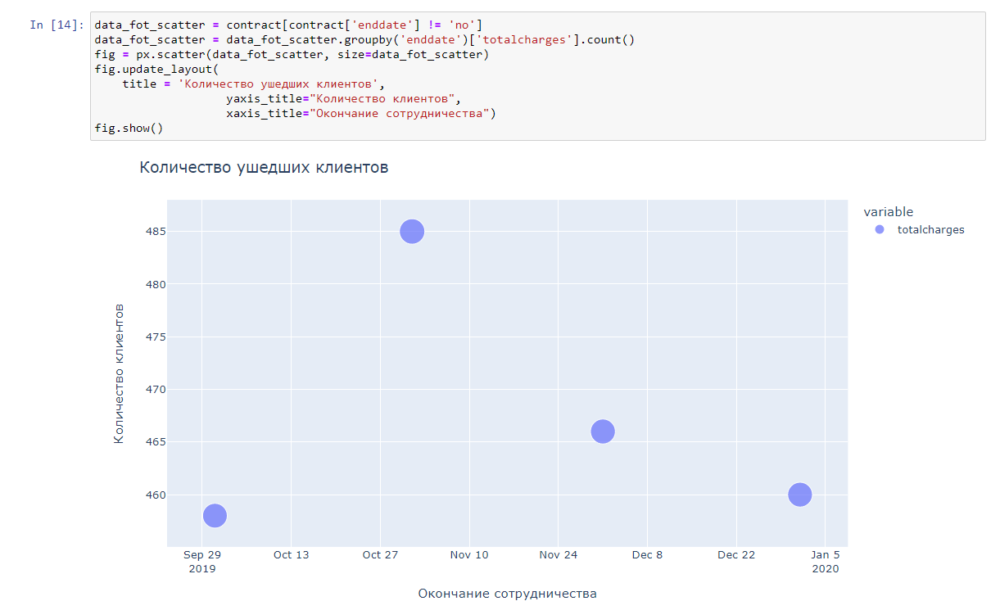


 Судя по данным, клиенты начали отключаться с октября 2019 года, и продолжают уходить примерно в одинаковом количестве.


##  **Анализ платежей клиентов**


 Monthly Charges.


In [15]:
fig = px.histogram(contract,
                   x = 'monthlycharges',
                   color = 'churn',
                   marginal = 'box',
                   opacity = 0.5)
fig.update_layout(
    title = 'Распределение величин ежемесячных платежей',
                   yaxis_title="Количество клиентов",
                   xaxis_title="Величина ежемесячного платежа, у.е.")
fig.show()

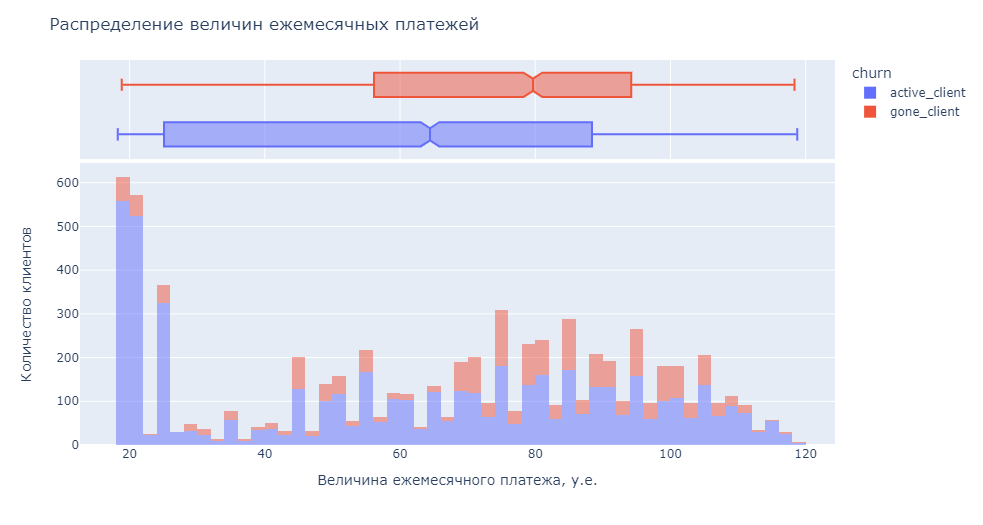

 Наибольший пик по количеству пользователей находится в зоне ~20 у.е. в месяц, второй пик наблюдается около 80.  
    Что касается ушедших клиентов: чаще уходят те, кто платит больше 70 у.е.


 Выбросов нет. У действующих клиентов медианные значения и квартили ниже, чем у ушедших.



# Total Charges.


In [16]:
fig = px.histogram(contract,
                   x = 'totalcharges',
                   color = 'churn',
                   marginal = 'box',
                   opacity = 0.5)
fig.update_layout(
    title = 'Распределение величин ежемесячных платежей',
                   yaxis_title="Количество клиентов",
                   xaxis_title="Величина общего платежа, у.е.")
fig.show()

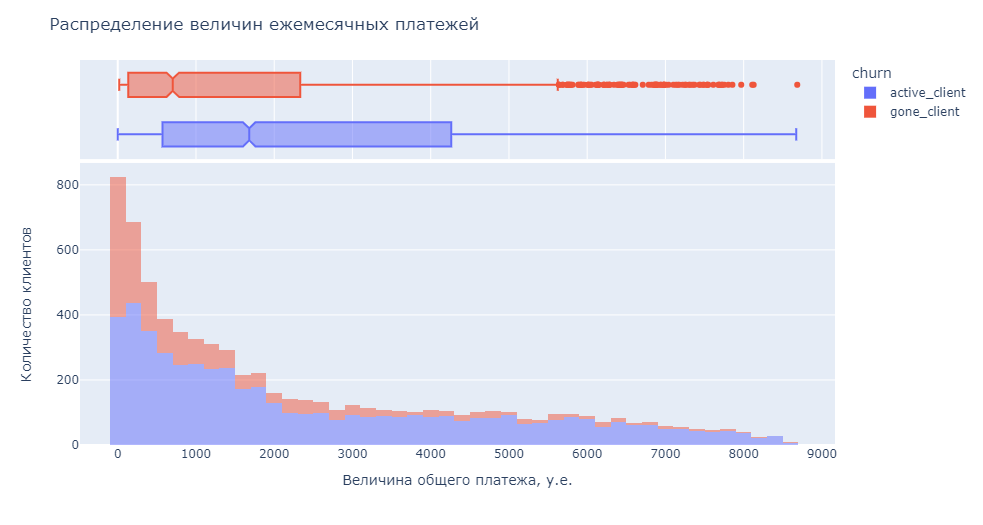

  На графике мы видим нисходящую тенденцию. Количество пользователей, которые заплатили больше 3000 у.е., мало. Общая масса клиентов, и активных, и ушедших, находится до 2000.  
    Большинство ушедших клиентов находятся до 1000 у.е., из графика выше мы знаем, что большая часть из них платила <70 у.е., это может означать, что многие клиенты пользуются услугами оператора не слишком долго - около года. 


  Для ушедших клиентов наблюдается некоторое количество выбросов после 5500 у.е. В данном случае медианное значение для действующих клиентов выше.


##  **Влияние типа контракта**


In [17]:
fig = go.Figure(data=[go.Histogram(x=contract['type'])])
fig.update_layout(
    title = 'Тип контракта',
                   yaxis_title="Количество клиентов",
                   xaxis_title="Тип контракта")
fig.show()

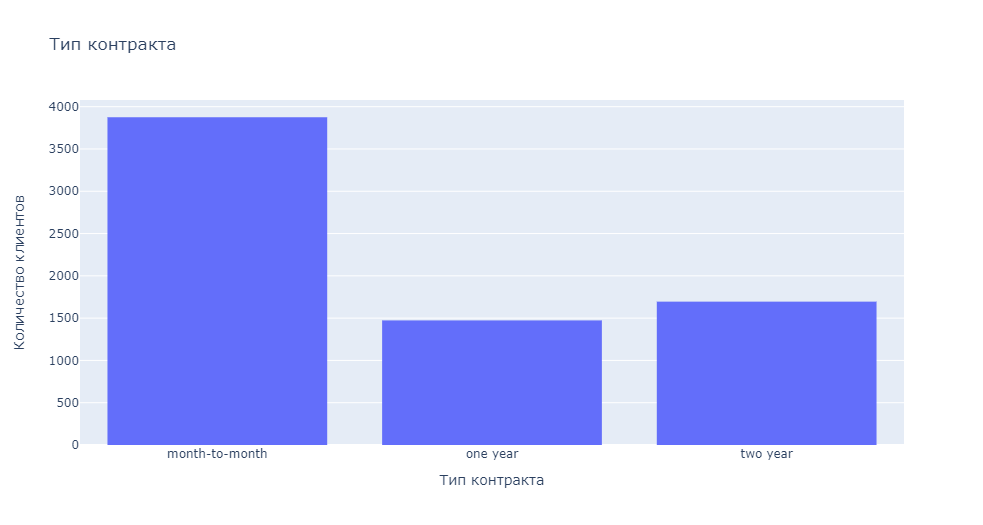

In [18]:
data_hist_gone = contract[contract['churn'] != 'active_client']
data_hist_active = contract[contract['churn'] == 'active_client']
fig = go.Figure()
fig.add_trace(go.Histogram(x=data_hist_active['type'], name='active_client'))
fig.add_trace(go.Histogram(x=data_hist_gone['type'], name='gone_client'))
fig.update_layout(
    title = 'Тип контракта',
                   yaxis_title="Количество клиентов",
                   xaxis_title="Тип контракта")
fig.show()

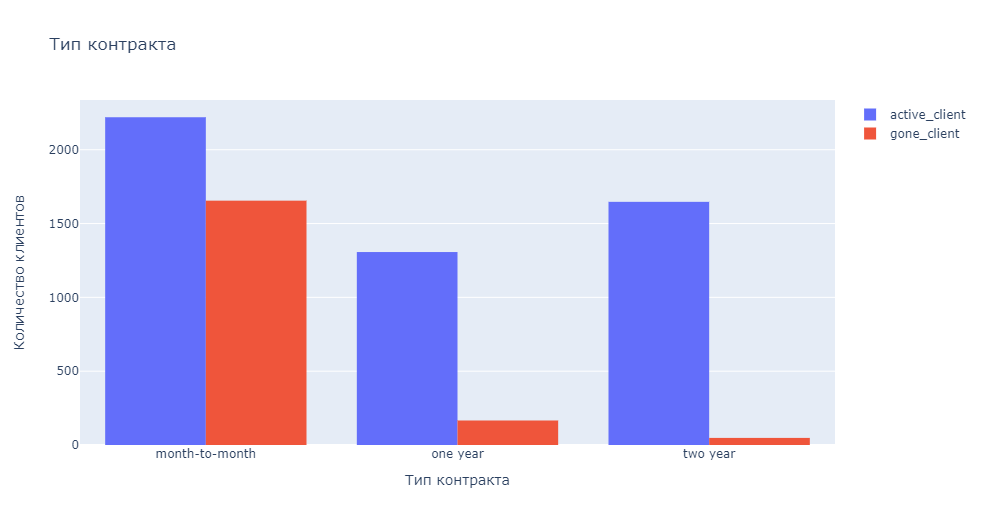

Доля ушедших клиентов намного выше среди краткосрочных контрактов и достигает, судя по графику, около 40% от общего числа. Наименьшее число ушедших среди клиентов с долгосрочной подпиской.
   

In [19]:
fig = px.violin(contract, x="type", y="totalcharges", color="churn", box=True, hover_data=contract.columns)
fig.update_layout(
    title = 'Распределение по общей стоимости контракта, у.е.',
                   yaxis_title="Величина стоимости контракта, у.е.",
                   xaxis_title="Тип контракта")
fig.show()

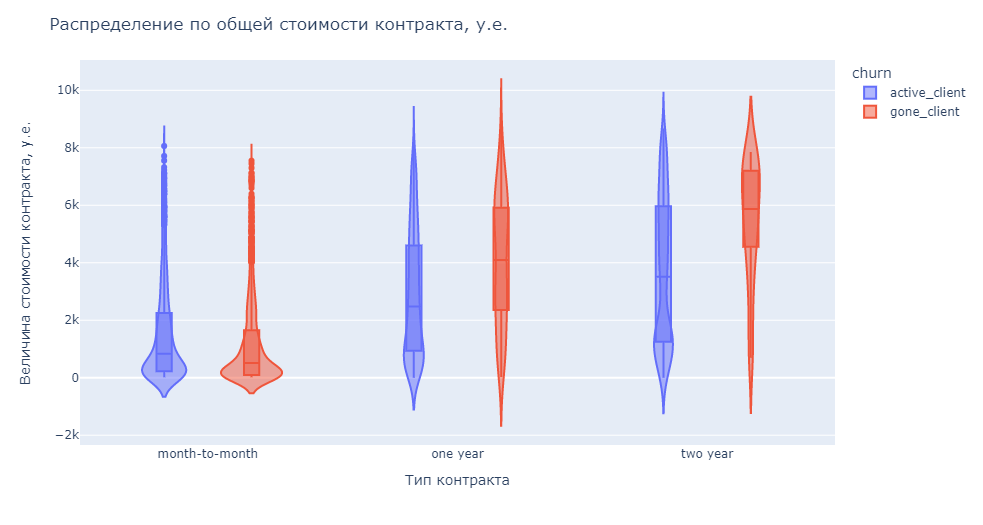

Самую высокую суммарную прибыль приносят клиенты с долгосрочными контрактами. Важно отметить, что несмотря на малочисленность ушедших клиентов с двухгодичным контрактом, они приносили наибольшую суммарную прибыль из всех.
  

##  **Анализ влияния способов оплаты**
   

In [20]:
fig = go.Figure(data=[go.Histogram(x=contract['paymentmethod'])])
fig.update_layout(
    title = 'Метод оплаты',
                   yaxis_title="Количество клиентов",
                   xaxis_title="Метод оплаты")
fig.show()

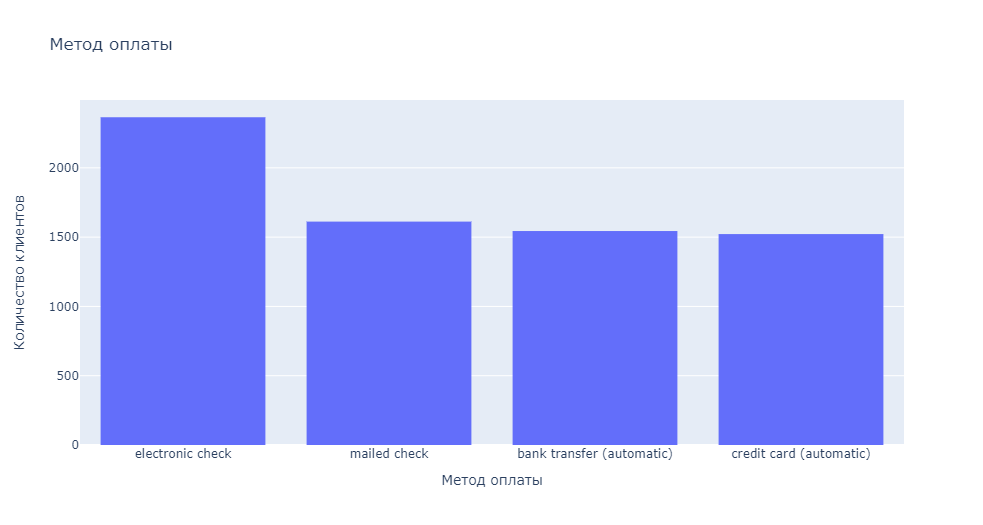

In [21]:
data_hist_gone = contract[contract['churn'] != 'active_client']
data_hist_active = contract[contract['churn'] == 'active_client']
fig = go.Figure()
fig.add_trace(go.Histogram(x=data_hist_active['paymentmethod'], name='active_client'))
fig.add_trace(go.Histogram(x=data_hist_gone['paymentmethod'], name='gone_client'))
fig.update_layout(
    title = 'Метод оплаты',
                   yaxis_title="Количество клиентов",
                   xaxis_title="Метод оплаты")
fig.show()

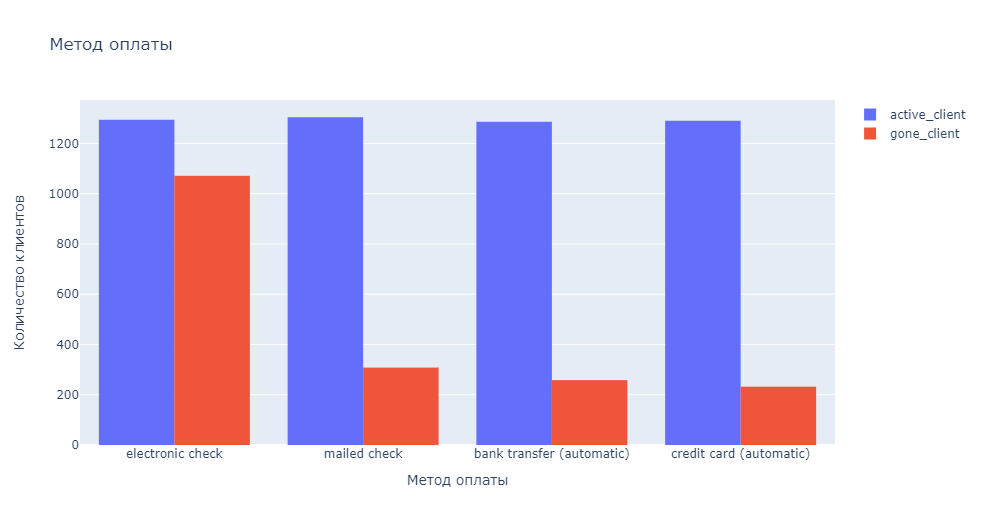

  Чаще всего уходят клиенты, выбравшие электорнный чек. Около 45% от общего числа тех, кто выбрал данный способ оплаты.


In [22]:
fig = px.violin(contract, x="paymentmethod", y="monthlycharges", color="churn", box=True, hover_data=contract.columns)
fig.update_layout(
    title = 'Распределение по величине месячных платежей, у.е.',
                   yaxis_title="Величина месячного платежа, у.е.",
                   xaxis_title="Тип контракта")
fig.show()

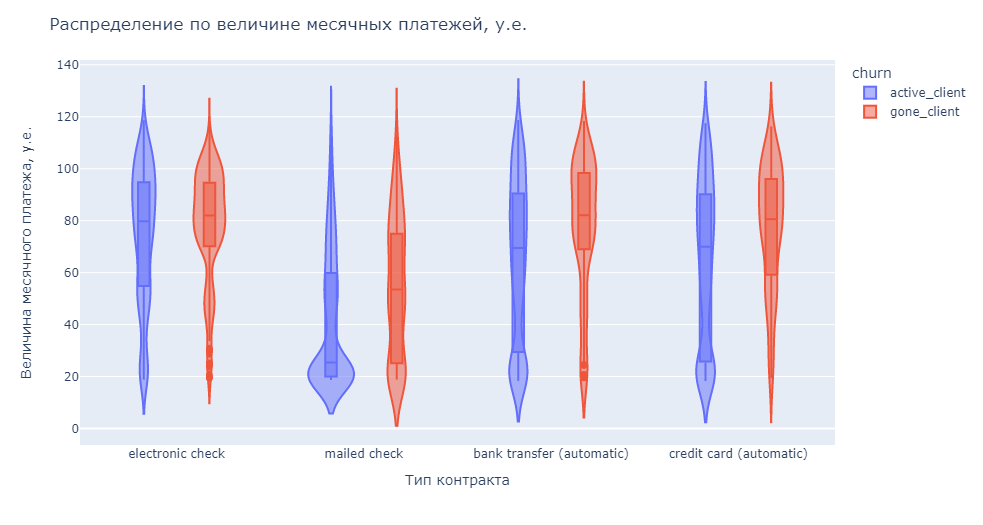

Наибольшая месячная стоимость у электронного чека. Наименьшая стоимость у чеков, высылаемых по почте. Автоматические платежи чуть меньше по размеру, чем электронные чеки.


## **Анализ используемых услуг** 


 Для полноценного анализа проведем объединение таблиц.


In [23]:
telecom = contract.merge(personal, on = 'customerid', how = 'left')
telecom = telecom.merge(internet, on = 'customerid', how = 'left')
telecom = telecom.merge(phone, on = 'customerid', how = 'left')

In [24]:
telecom.loc[telecom['internetservice'].isna() == False, 'internet_client'] = 'yes'
telecom.loc[telecom['internetservice'].isna() == True, 'internet_client'] = 'no'
telecom.loc[telecom['multiplelines'].isna() == True, 'phone_client'] = 'no'
telecom.loc[telecom['multiplelines'].isna() == False, 'phone_client'] = 'yes'

telecom.loc[(telecom['internet_client']== 'no') & (telecom['phone_client']== 'yes'), 'tariff'] = 'only phone'
telecom.loc[(telecom['internet_client']== 'yes') & (telecom['phone_client']== 'no'), 'tariff'] = 'only internet'
telecom.loc[(telecom['internet_client']== 'yes') & (telecom['phone_client']== 'yes'), 'tariff'] = 'internet + phone'

In [25]:
fig = go.Figure(data=[go.Histogram(x=telecom['tariff'])])
fig.update_layout(
    title = 'Распределение по тарифам',
                   yaxis_title="Количество клиентов",
                   xaxis_title="Тариф")
fig.show()

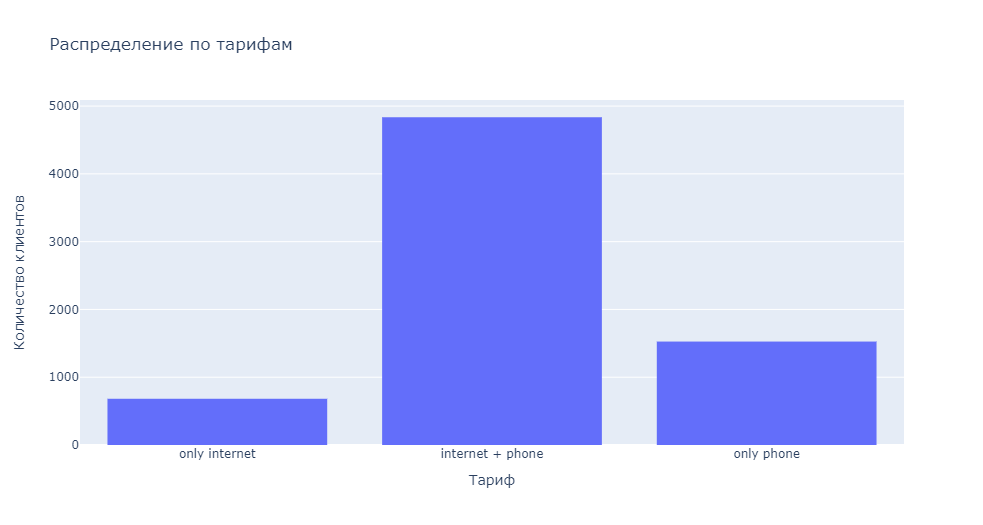

In [26]:
data_hist_gone = telecom[telecom['churn'] != 'active_client']
data_hist_active = telecom[telecom['churn'] == 'active_client']
fig = go.Figure()
fig.add_trace(go.Histogram(x=data_hist_active['tariff'], name='active_client'))
fig.add_trace(go.Histogram(x=data_hist_gone['tariff'], name='gone_client'))
fig.update_layout(
     title = 'Распределение по тарифам',
                   yaxis_title="Количество клиентов",
                   xaxis_title="Тариф")
fig.show()

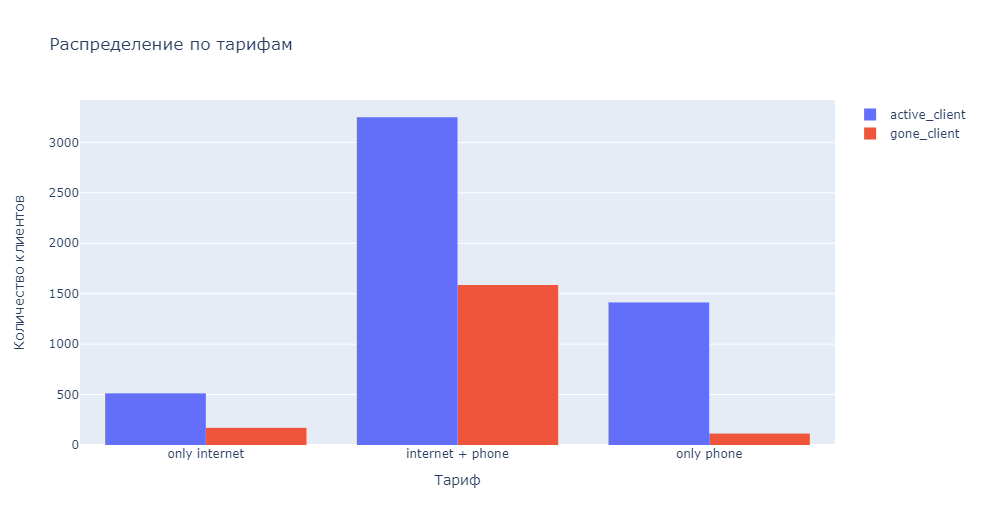

In [27]:
tariff_phone = telecom.pivot_table(index=telecom['phone_client'], 
                                   columns = 'churn', values = 'customerid', aggfunc = 'count')
tariff_phone['ratio'] = tariff_phone['gone_client'] / (tariff_phone['gone_client'] \
                                                       + tariff_phone['active_client'])
tariff_phone

churn,active_client,gone_client,ratio
phone_client,,,
no,512,170,0.249267
yes,4662,1699,0.267096


In [28]:
tariff_internet = telecom.pivot_table(index=telecom['internet_client'], 
                                      columns = 'churn', values = 'customerid', aggfunc = 'count')
tariff_internet['ratio'] = tariff_internet['gone_client'] / (tariff_internet['gone_client'] \
                                                             + tariff_internet['active_client'])
tariff_internet

churn,active_client,gone_client,ratio
internet_client,,,
no,1413,113,0.074050
yes,3761,1756,0.318289


 Судя по данным, клиенты чаще недовольны интернетом. Использующие только телефон крайне редко отказываются от услуг.


##  📍**Выводы по исследовательскому анализу данных**
    


 Клиент, который может отказаться от услуг:  
    - Пользуется интернетом;  
    - Оплачивает услуги с помощью электронного чека;  
    - Пользуется ежемесячной оплатой;  
    - Платит более 70 у.е. в месяц;  
    - Имеет общую стоимость контракта менее 2000 у.е.
    
С большей долей вероятности можно утверждать, что клиентов не устраивают цены. Большинство отказавшихся клиентов платили больше оставшихся. Возможно, есть проблемы с оплатой через электронный чек и качеством интернета.  
Важно отметить, что те, кто пользуются только телефоном, или те, кто заключают договор на 2 года, отказываются от услуг реже всего.


## **План работы**
    



1. **Предобработка данных**  
Обработка пропусков - решить вопрос о недостающих данных (найти, удалить, заполнить).     
    
2. **Подбор фич**  
Перевод категориальных признаков в количественные, создание новых, удаление ненужных. Выделить целевой признак.  
    
3. **Подбор и обучение модели**  
Upsampling (?), разбить сет на выборки. Предварительное обучение моделей, подбор гиперпараметров.  

4. **Выбор и тестирование финальной модели**  
Выбор наилучшей модели, валидация результата на тестовой выборке. 



## **Вопросы**



1. В данном проекте необходимо решить задачу бинарной классификации, какую метрику использовать для оценки результата?
2. Какого значения метрики необходимо достичь?
3. Расшифровка столбцов в сете с персональными данными. Можно ли получить ее?
4. Почему данные о клиентах, отказавшихся от услуг, начинаются с 2019 года? Маловероятно, что до этого никто не отказывался от услуг оператора.
5. Необходимо ли провести масштабирование признаков?
6. Вероятно, общая стоимость контракта и ежемесячный платеж будут сильно коррелировать. В таком случае, какой признак лучше удалить?


##  **Предобработка данных**
    



Основная задача на данном этапе - разобраться с пропусками, которые появились после объединения таблиц. Посмотрим, сколько их и где.


In [29]:
print('Пропущенные значения по признакам:')
print(telecom.isna().sum())
fig = go.Figure(data=go.Heatmap(
        z=telecom.isna().sum(),
        x=telecom.isnull().sum(),
        y=telecom.columns,
        colorscale='Viridis'))
fig.show()

Пропущенные значения по признакам:
customerid             0
begindate              0
enddate                0
type                   0
paperlessbilling       0
paymentmethod          0
monthlycharges         0
totalcharges           0
churn                  0
gender                 0
seniorcitizen          0
partner                0
dependents             0
internetservice     1526
onlinesecurity      1526
onlinebackup        1526
deviceprotection    1526
techsupport         1526
streamingtv         1526
streamingmovies     1526
multiplelines        682
internet_client        0
phone_client           0
tariff                 0
dtype: int64


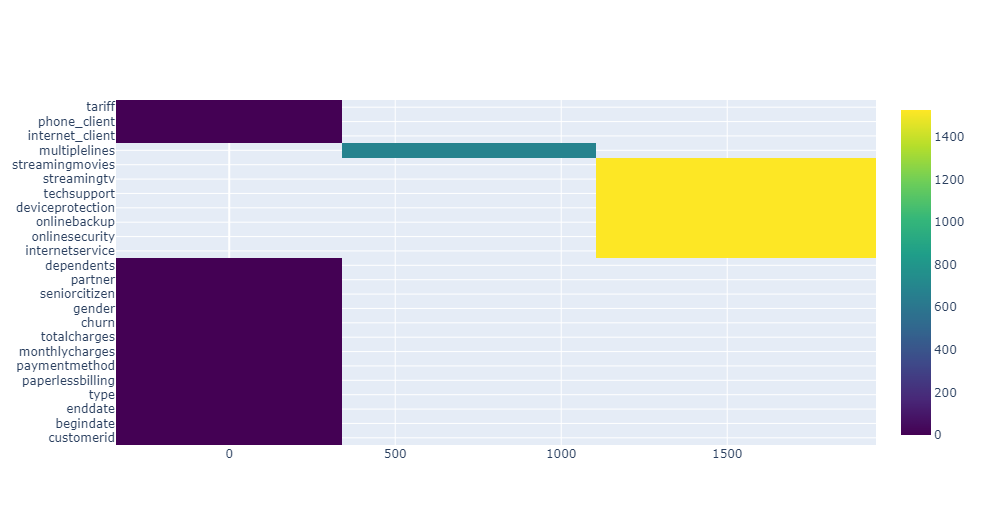


Все пропущенные значения появились потому, что часть клиетов пользуется только интеренетом или только телефоном. Необходимо отметить это в сете. Все пропущенные значения заменим на строки 'no_internet'/'no_phone'.


In [30]:
telecom['multiplelines'] = telecom['multiplelines'].fillna('no')
telecom = telecom.fillna('no')


Преобразуем все значения вида Yes-No в числа.


In [31]:
for column in telecom:
    tcu = telecom[column].unique()
    if list(tcu) == ['no', 'yes'] or list(tcu) == ['yes', 'no'] :
        telecom[column] = telecom[column].apply(lambda x: 0 if x =='no' else 1)

## **Работа с признаками**
    


###  **Целевой признак**
    


 
Для начала необходимо выделить целевой признак. 


In [32]:
telecom['target'] = telecom['churn'].apply(lambda x: 0 if x =='active_client' else 1)

### **Создание новых признаков**
    


  
Добавим новый обучающий признак - дни активности абонента. В дальнейшем нам придется избавиться от дат: дата начала договора нам мало о чём скажет. Добавление данного признака поможет нам сохранить информацию, которую они содержат. 

Для начала заменим все 'no' значения в дате окончания контракта на дату выгрузки датасета (держим в голове, что 'no' в случае EndDate означает 1 февраля 2020 (исходя из условий задачи)), чтобы сделать возможной дальнейшую работу с ними.


In [33]:
telecom['enddate_true'] = telecom['enddate'].apply(lambda x: '2020-02-01' if x =='no' else x)
telecom['enddate_true'] = pd.to_datetime(telecom['enddate_true'])
telecom['using_service_day'] = (telecom['enddate_true'] - telecom['begindate']).dt.days
telecom['using_service_day'] = telecom['using_service_day'].astype('int')

In [34]:
display(telecom['using_service_day'].value_counts())
fig = go.Figure()
fig.add_trace(go.Histogram(x=telecom['using_service_day'], name='using_service_day'))
fig.update_layout(
     title = 'Дни активности абонента',
                   yaxis_title="Количество клиентов",
                   xaxis_title="Количество дней")
fig.show()

31      431
2191    362
30      182
92      169
2163    164
       ... 
1400      2
1948      2
2070      2
2161      1
1917      1
Name: using_service_day, Length: 156, dtype: int64

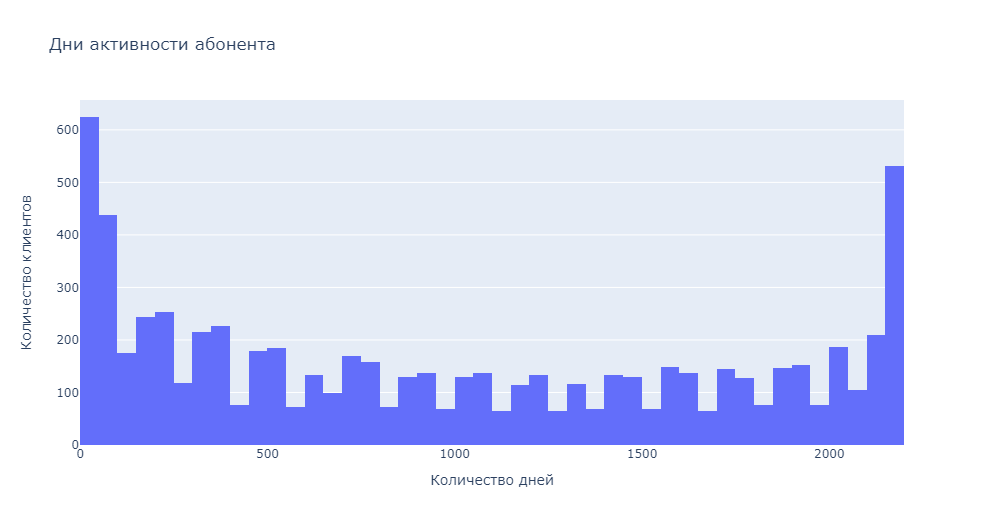


Допустим, этот признак не является утечкой целевого признака.
  


###  **Удаление ненужных признаков**
    


 
Для начала удалим все признаки, которые создавались для анализа данных, даты и customerid.
    

In [35]:
telecom = telecom.drop(['churn', 'internet_client', 'phone_client',
                        'tariff', 'enddate_true', 'customerid', 'begindate', 'enddate'], axis=1)


Для того, чтобы определить, какие еще признаки можно удалить, сделаем две вещи:     

- Посмотрим матрицу корреляции  
- Проверим, какие признаки важны для обучения моделей  
    

In [36]:
telecom_corr = telecom.corr()
telecom_corr['target'].sort_values(ascending=False)

target               1.000000
monthlycharges       0.193356
paperlessbilling     0.191825
seniorcitizen        0.150889
streamingtv          0.063228
streamingmovies      0.061382
multiplelines        0.040102
deviceprotection    -0.066160
onlinebackup        -0.082255
partner             -0.150448
dependents          -0.164221
techsupport         -0.164674
onlinesecurity      -0.171226
totalcharges        -0.198324
using_service_day   -0.352673
Name: target, dtype: float64

In [37]:
categories = ["type", "paymentmethod", "internetservice", "gender", "seniorcitizen", "partner", "dependents", "paperlessbilling", "multiplelines", \
              "onlinesecurity", "onlinebackup", "deviceprotection", "techsupport", "streamingtv", "streamingmovies" ]
target = "target"
features = list(set(telecom.columns) - set([target]))

In [38]:
X, y = telecom[features], telecom[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
train_ds = Pool(data=X_train, label=y_train, cat_features=categories, feature_names=features)
test_ds = Pool(data=X_test, label=y_test, cat_features=categories, feature_names=features)
full_ds = Pool(data=X, label=y, cat_features=categories, feature_names=features)
scale_pos_weight=(y_train==0).sum()/(y_train==1).sum()
cb = CatBoostClassifier(verbose=0, scale_pos_weight=scale_pos_weight, random_seed=42, devices='0:1').fit(train_ds)
telecom_feature_importances = pd.DataFrame(((zip(cb.feature_names_, cb.get_feature_importance())))).rename(columns={0:"feature",1:"score"}).sort_values(by="score", ascending = False )

In [39]:
telecom_feature_importances['score'] = telecom_feature_importances['score'].astype(float)
fig = px.bar(telecom_feature_importances, x=telecom_feature_importances['score'], y=telecom_feature_importances["feature"])
fig.show()

 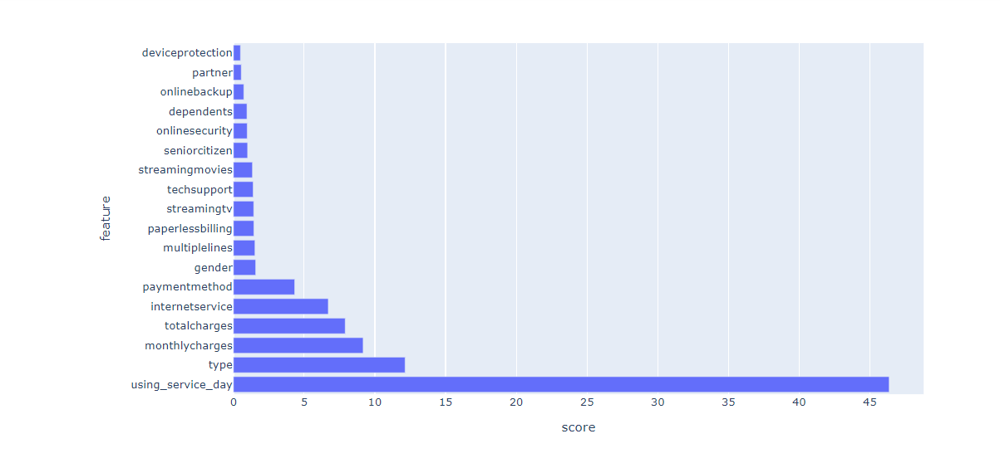


 
В качестве эксперимента оставим только признаки со скорингом больше 1.
   

In [40]:
telecom_feature_importances
features_choosen = list(telecom_feature_importances.query('score > 1')['feature'])
features_choosen

['using_service_day',
 'type',
 'monthlycharges',
 'totalcharges',
 'internetservice',
 'paymentmethod',
 'multiplelines',
 'paperlessbilling',
 'streamingmovies',
 'gender',
 'streamingtv',
 'onlinebackup',
 'dependents',
 'techsupport',
 'seniorcitizen',
 'onlinesecurity',
 'partner']

In [41]:
target_name = 'target'
columns = features_choosen + [target_name]
telecom_new = telecom[columns]

In [42]:
corr = telecom_new['monthlycharges'].corr(telecom_new['totalcharges'])
print('Корреляция между monthlycharges и totalcharges = {:.2f}'.format(corr))
corr = telecom_new['using_service_day'].corr(telecom_new['totalcharges'])
print('Корреляция между totalcharges и using_service_day = {:.2f}'.format(corr))
corr = telecom_new['using_service_day'].corr(telecom_new['monthlycharges'])
print('Корреляция между monthlycharges и using_service_day = {:.2f}'.format(corr))

Корреляция между monthlycharges и totalcharges = 0.65
Корреляция между totalcharges и using_service_day = 0.83
Корреляция между monthlycharges и using_service_day = 0.25


In [43]:
numeric = ['using_service_day',
 'totalcharges',
 'monthlycharges']
fig = px.imshow(telecom_new[numeric].corr())
fig.show()

In [44]:
telecom_new = telecom_new.drop('totalcharges', 1)

### **Преобразование категориальных признаков в численные**
    


In [45]:
telecom_new_ohe = pd.get_dummies(telecom_new , drop_first=True)
telecom_new_ohe.head()

,using_service_day,monthlycharges,multiplelines,paperlessbilling,streamingmovies,streamingtv,onlinebackup,dependents,techsupport,seniorcitizen,...,partner,target,type_one year,type_two year,internetservice_fiber optic,internetservice_no,paymentmethod_credit card (automatic),paymentmethod_electronic check,paymentmethod_mailed check,gender_male
0,31,29.85,0,1,0,0,1,0,0,0,...,1,0,0,0,0,0,0,1,0,0
1,1036,56.95,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,1
2,61,53.85,0,1,0,0,1,0,0,0,...,0,1,0,0,0,0,0,0,1,1
3,1371,42.30,0,0,0,0,0,0,1,0,...,0,0,1,0,0,0,0,0,0,1
4,61,70.70,0,1,0,0,0,0,0,0,...,0,1,0,0,1,0,0,1,0,0


### **Подготовка признаков**
    


 Разделим данные на три выборки: обучающую, валидационную и тестовую, в соотношении 3/1/1.
    


In [46]:
features = telecom_new_ohe.drop('target', axis=1)
target = telecom_new_ohe['target']

In [47]:
def split_data(features, target):
    (features_train,
     features_valid,
     target_train,
     target_valid) = train_test_split(features,
                                      target,
                                      test_size = 0.4,
                                      random_state = 12345)
    (features_test,
     features_valid,
     target_test,
     target_valid) = train_test_split(features_valid,
                                      target_valid,
                                      test_size = 0.5,
                                      random_state = 12345)
    
    return (features_train,
            features_valid,
            features_test,
            target_train,
            target_valid,
            target_test)

In [48]:
(features_train,
 features_valid,
 features_test,
 target_train,
 target_valid,
 target_test) = split_data(features, target)

In [49]:
print('Обучающая:',features_train.shape, target_train.shape) 
print('Валидационная:', features_valid.shape, target_valid.shape) 
print('Тестовая:', features_test.shape, target_test.shape)

Обучающая: (4225, 20) (4225,)
Валидационная: (1409, 20) (1409,)
Тестовая: (1409, 20) (1409,)


### **Масштабирование**
    


 Проведем масштабирование количественных признаков при помощи стандартизации.
    



In [50]:
numeric = ["monthlycharges", "using_service_day"]

In [51]:
scaler = StandardScaler()
scaler.fit(features_train[numeric])

StandardScaler()

In [52]:
features_train[numeric] = scaler.transform(features_train[numeric])
features_train.head()                                          

,using_service_day,monthlycharges,multiplelines,paperlessbilling,streamingmovies,streamingtv,onlinebackup,dependents,techsupport,seniorcitizen,onlinesecurity,partner,type_one year,type_two year,internetservice_fiber optic,internetservice_no,paymentmethod_credit card (automatic),paymentmethod_electronic check,paymentmethod_mailed check,gender_male
836,1.193698,0.219283,0,0,1,0,0,1,1,0,1,1,1,0,0,0,1,0,0,1
1005,0.825429,1.028885,1,1,1,1,0,0,0,1,0,1,1,0,1,0,1,0,0,0
4220,0.908760,-1.499261,0,0,0,0,0,1,0,0,0,1,1,0,0,1,0,0,1,1
6543,1.193698,-0.332042,0,0,0,0,0,1,0,0,1,1,1,0,0,0,1,0,0,0
272,-1.303542,-1.323764,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [53]:
features_valid[numeric] = scaler.transform(features_valid[numeric])
features_valid.head() 

,using_service_day,monthlycharges,multiplelines,paperlessbilling,streamingmovies,streamingtv,onlinebackup,dependents,techsupport,seniorcitizen,onlinesecurity,partner,type_one year,type_two year,internetservice_fiber optic,internetservice_no,paymentmethod_credit card (automatic),paymentmethod_electronic check,paymentmethod_mailed check,gender_male
6085,-1.220212,-0.467804,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
6373,0.457160,0.932859,0,1,1,1,0,1,0,0,0,1,0,0,1,0,0,0,0,1
1488,-1.302198,-0.447936,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1
703,-1.260533,-1.464492,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0
3572,-0.033417,0.487494,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0


In [54]:
features_test[numeric] = scaler.transform(features_test[numeric])
features_test.head() 

,using_service_day,monthlycharges,multiplelines,paperlessbilling,streamingmovies,streamingtv,onlinebackup,dependents,techsupport,seniorcitizen,onlinesecurity,partner,type_one year,type_two year,internetservice_fiber optic,internetservice_no,paymentmethod_credit card (automatic),paymentmethod_electronic check,paymentmethod_mailed check,gender_male
4164,1.600945,1.527230,1,0,1,1,1,1,1,0,0,1,0,1,1,0,1,0,0,1
4068,-0.769956,-1.499261,0,1,0,0,0,1,0,0,0,1,1,0,0,1,0,0,1,0
6842,-0.811621,-1.484360,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1
914,1.600945,-1.310519,1,1,0,0,0,1,0,0,0,1,0,1,0,1,0,0,0,1
6877,-1.302198,0.162991,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


###  **Upsampling**
    


In [55]:
telecom_new_ohe['target'].value_counts(normalize=True)

0    0.73463
1    0.26537
Name: target, dtype: float64

In [56]:
def upsample(features, target):
    
    if ((target_train[target_train == 1].count() / target_train[target_train == 0].count()) > 1):
        print('Положительных значений больше чем отрицательных, увеличение не требуется')
        return features, target
    
    features_zeros = features[target == 0]
    features_ones = features[target == 1]
    target_zeros = target[target == 0]
    target_ones = target[target == 1]

    repeat = round(1 / (target_train[target_train == 1].count() / target_train[target_train == 0].count()))
    features_upsampled = pd.concat([features_zeros] + [features_ones] * repeat)
    target_upsampled = pd.concat([target_zeros] + [target_ones] * repeat)
    features_upsampled, target_upsampled = shuffle(features_upsampled, target_upsampled, random_state=42)
    
    return features_upsampled, target_upsampled

features_upsampled, target_upsampled = upsample(features_train, target_train)
target_upsampled.value_counts()

1    3303
0    3124
Name: target, dtype: int64

In [57]:
print('Размеры таблицы features_upsampled:', features_upsampled.shape)
print('Размеры таблицы target_upsampled:',target_upsampled.shape)
print()
print(target_upsampled.value_counts(normalize=True))

Размеры таблицы features_upsampled: (6427, 20)
Размеры таблицы target_upsampled: (6427,)

1    0.513926
0    0.486074
Name: target, dtype: float64


##  **Обучение модели**
    


###  **Подготовка**
    


In [58]:
roc_auc = make_scorer(roc_auc_score, greater_is_better=True, needs_proba=True)

In [59]:
def auc_roc_val(model, fv, tv, name):
    
    predictions_valid = model.predict(fv)
    probabilities_valid = model.predict_proba(fv)
    predict_true_probalities = model.predict_proba(fv)[:, 1]
    fpr, tpr, thresholds = roc_curve(tv, predict_true_probalities)
    
    print(name + ' AUC-ROC = {:.2f}'.format(roc_auc_score(tv, probabilities_valid[:,1])))    
    print(name + ' accuracy_score = {:.2f}'.format(accuracy_score(tv, predictions_valid)))
    
    fig = px.area(x=fpr, y=tpr,
    title=f'ROC Curve (AUC={auc(fpr, tpr):.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500)
    fig.add_shape(type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1)
    fig.show()

In [60]:
def ml_models(models, ft, tt, fv, tv):
    
    model = models
    model.fit(ft, tt)
    predictions_valid = model.predict(fv)
    probabilities_valid = model.predict_proba(fv)
    print('AUC-ROC = {:.2f}'.format(roc_auc_score(tv, probabilities_valid[:,1])))    
    print('accuracy_score = {:.2f}'.format(accuracy_score(tv, predictions_valid)))
    print("Полнота = {:.2f}" .format(recall_score(tv, predictions_valid)))
    print("Точность = {:.2f}".format(precision_score(tv, predictions_valid)))
    print("F1-мера = {:.2f}".format(f1_score(tv, predictions_valid)))
  
        
def gridsearchcv(model, grid, features, target):

    CV = GridSearchCV(estimator = model, param_grid = grid, cv = 5, scoring = roc_auc)
    CV.fit(features, target)
    print('AUC-ROC = {:.2f}'.format(CV.best_score_))
    print(CV.best_params_)
    
def rand_search(model, grid, features, target):

    search = RandomizedSearchCV(model, grid, cv=5, scoring=roc_auc, n_jobs=-1)
    search.fit(features, target)
    print('AUC-ROC = {:.2f}'.format(search.best_score_))
    print(search.best_params_)

###  **RandomForestClassifier**
    


  Обучение модели без подбора гиперпараметров.
    


In [61]:
ml_models(RandomForestClassifier(random_state=42), features_upsampled, target_upsampled, features_valid, target_valid)

AUC-ROC = 0.82
accuracy_score = 0.78
Полнота = 0.59
Точность = 0.60
F1-мера = 0.59


Подбор параметров.
    


In [62]:
rfc = RandomForestClassifier(random_state=42)

rfc_params = dict(max_depth=range(2, 15, 2), 
                 max_features=range(2, 15, 2),
                 n_estimators=range(25, 200, 25))

In [63]:
rand_search(rfc, rfc_params, features_upsampled, target_upsampled)

AUC-ROC = 0.97
{'n_estimators': 175, 'max_features': 14, 'max_depth': 14}


In [64]:
rfc = RandomForestClassifier(random_state=42, n_estimators = 150, max_features = 10, max_depth = 14)
rfc.fit(features_upsampled, target_upsampled)

auc_roc_val(rfc, features_valid, target_valid, 'Результат на валидационной выборке:')

Результат на валидационной выборке: AUC-ROC = 0.84
Результат на валидационной выборке: accuracy_score = 0.79


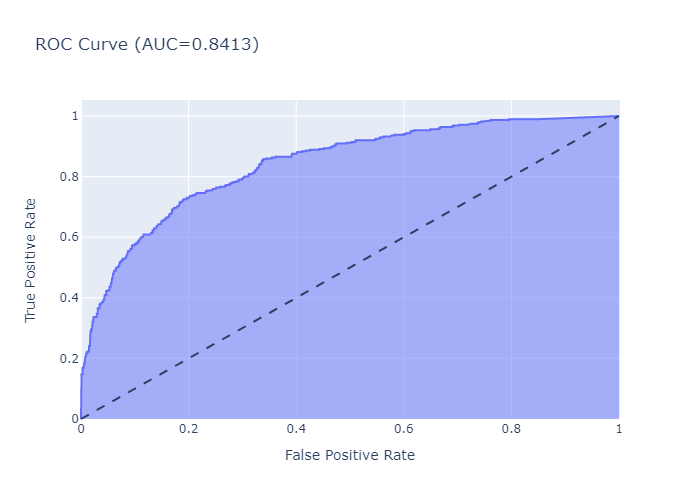

### **GradientBoostingClassifier**
    


Обучение модели без подбора гиперпараметров.
    


In [65]:
ml_models(GradientBoostingClassifier(random_state=42), features_upsampled, target_upsampled, features_valid, target_valid)

AUC-ROC = 0.87
accuracy_score = 0.77
Полнота = 0.78
Точность = 0.56
F1-мера = 0.65


Подбор параметров.
    


In [66]:
gbr = GradientBoostingClassifier(random_state=42)

gbr_params = dict(n_estimators=range(50, 200, 25),
                  max_depth=[2,3,4], 
                  learning_rate=[0.1,0.5,1],
                 )

In [67]:
gridsearchcv(gbr, gbr_params, features_upsampled, target_upsampled)

AUC-ROC = 0.98
{'learning_rate': 0.5, 'max_depth': 4, 'n_estimators': 175}


In [68]:
gbr = GradientBoostingClassifier(random_state=42, learning_rate = 0.5, max_depth = 2, n_estimators = 200)
gbr.fit(features_upsampled, target_upsampled)

auc_roc_val(gbr, features_valid, target_valid, 'Результат на валидационной выборке:')

Результат на валидационной выборке: AUC-ROC = 0.91
Результат на валидационной выборке: accuracy_score = 0.84


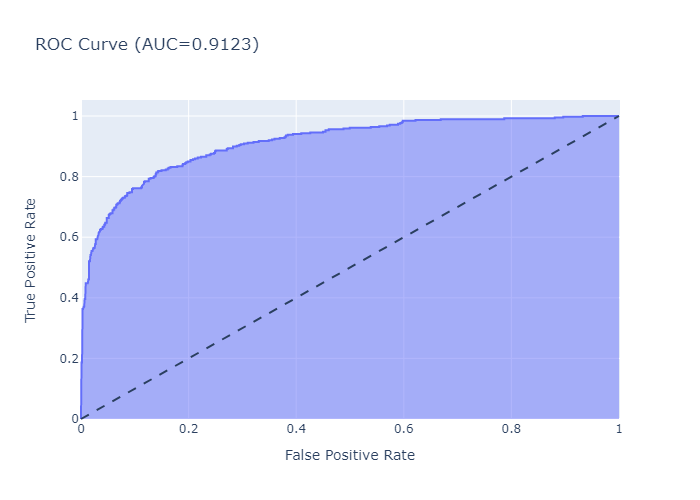

### **CatBoostClassifier**
    


 Обучение модели без подбора гиперпараметров.
    


In [69]:
ml_models(CatBoostClassifier(random_state=42, verbose = 0), features_upsampled, target_upsampled, features_valid, target_valid)

AUC-ROC = 0.89
accuracy_score = 0.83
Полнота = 0.78
Точность = 0.66
F1-мера = 0.72


 Подбор параметров.
    


In [70]:
cbc = CatBoostClassifier(random_state=42)
cbc_params = dict(n_estimators = range(50, 200, 25),
                  max_depth = [5, 7, 10],
                  verbose = [0],
                  learning_rate = [0.5, 0.1, 0.3],
                 )

In [71]:
rand_search(cbc, cbc_params, features_upsampled, target_upsampled)

AUC-ROC = 0.98
{'verbose': 0, 'n_estimators': 150, 'max_depth': 10, 'learning_rate': 0.5}


In [72]:
cbc = CatBoostClassifier(random_state=42, max_depth=4, n_estimators = 200, verbose=0, learning_rate=0.5)
cbc.fit(features_upsampled, target_upsampled)

auc_roc_val(cbc, features_valid, target_valid, 'Результат на валидационной выборке:')

Результат на валидационной выборке: AUC-ROC = 0.91
Результат на валидационной выборке: accuracy_score = 0.84


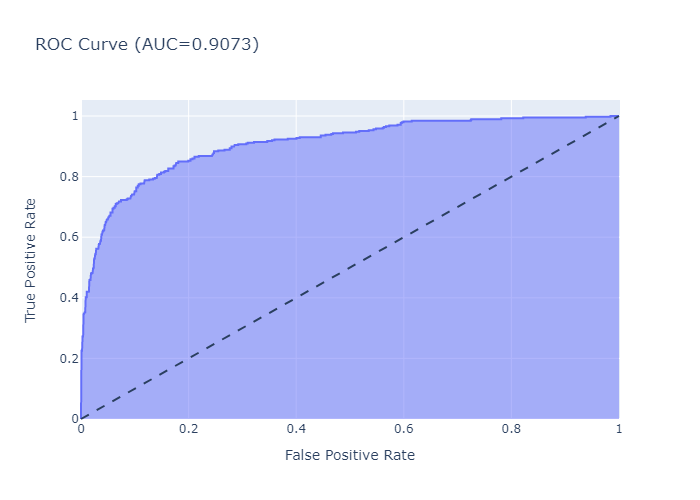

### **LGBMClassifier**
    


 Обучение модели без подбора гиперпараметров.
    


In [73]:
ml_models(LGBMClassifier(random_state=42), features_upsampled, target_upsampled, features_valid, target_valid)

AUC-ROC = 0.90
accuracy_score = 0.83
Полнота = 0.78
Точность = 0.66
F1-мера = 0.72


 Подбор параметров.
    


In [74]:
LGBM = LGBMClassifier()
LGBM_params = dict(n_estimators = [175, 200],
                   max_depth = [7, 10],
                   verbose = [0] 
                  )

In [75]:
ml_models(LGBMClassifier(random_state=42, n_estimators = 175, max_depth = 10), 
          features_upsampled, target_upsampled, features_valid, target_valid)

AUC-ROC = 0.90
accuracy_score = 0.85
Полнота = 0.76
Точность = 0.71
F1-мера = 0.73


In [76]:
lgbm = LGBMClassifier(random_state=42, max_depth = 10, n_estimators = 175)
lgbm.fit(features_upsampled, target_upsampled)

auc_roc_val(lgbm, features_valid, target_valid, 'Результат на валидационной выборке:')

Результат на валидационной выборке: AUC-ROC = 0.90
Результат на валидационной выборке: accuracy_score = 0.85


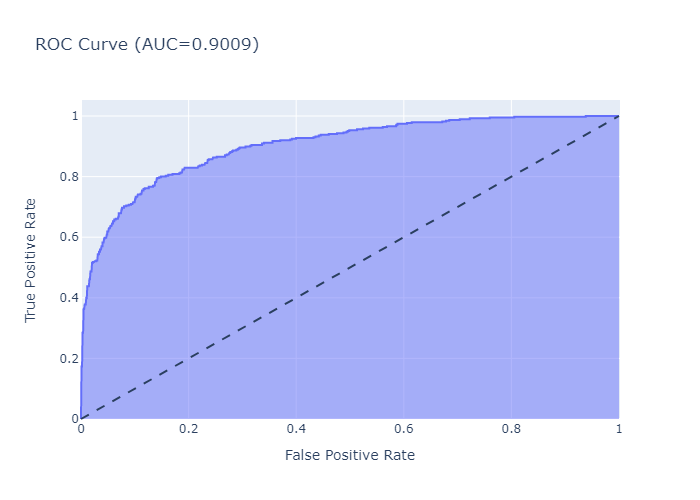

## **Анализ моделей**
    


 Определим метрику всех моделей на оставшейся тестовой выборке.
    


In [77]:
auc_roc_val(rfc, features_test, target_test, 'Результат RandomForrest на тестовой выборке:')

Результат RandomForrest на тестовой выборке: AUC-ROC = 0.86
Результат RandomForrest на тестовой выборке: accuracy_score = 0.81


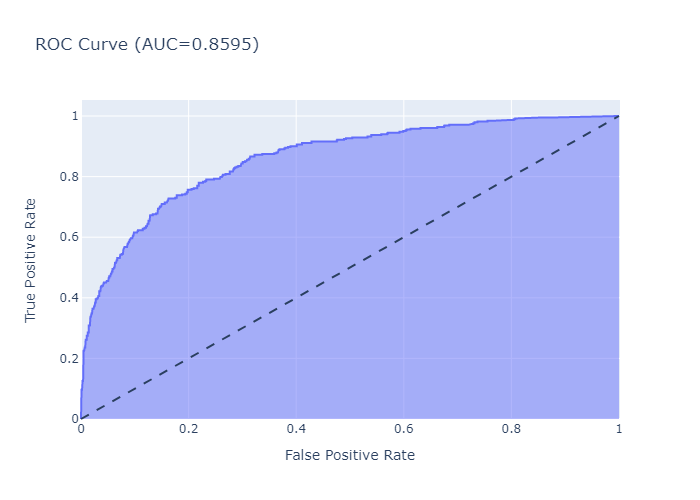

In [78]:
auc_roc_val(gbr, features_test, target_test, 'Результат GradBoost на тестовой выборке:')

Результат GradBoost на тестовой выборке: AUC-ROC = 0.92
Результат GradBoost на тестовой выборке: accuracy_score = 0.84


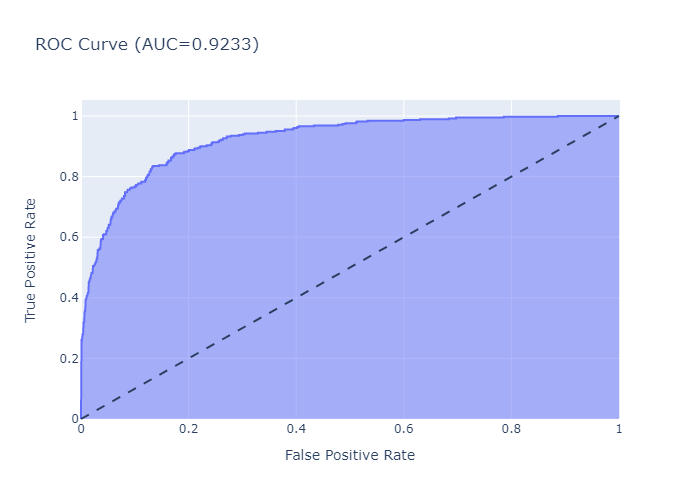

In [79]:
auc_roc_val(cbc, features_test, target_test, 'Результат CatBoost на тестовой выборке:')

Результат CatBoost на тестовой выборке: AUC-ROC = 0.92
Результат CatBoost на тестовой выборке: accuracy_score = 0.86


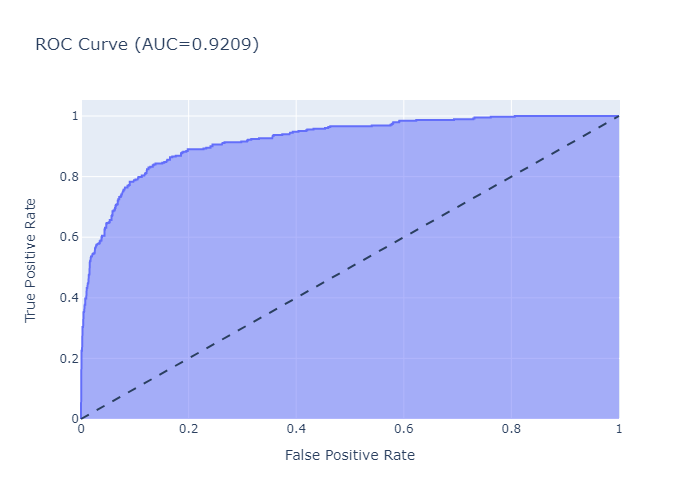

In [80]:
auc_roc_val(lgbm, features_test, target_test, 'Результат LightGBM на тестовой выборке:')

Результат LightGBM на тестовой выборке: AUC-ROC = 0.91
Результат LightGBM на тестовой выборке: accuracy_score = 0.84


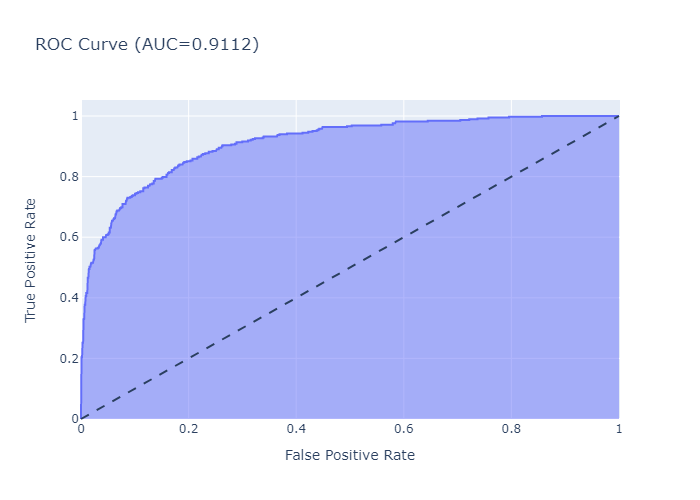

###  **Финальная модель**
    



Добавим график значимых признаков для CatBoost(наиболее успешная модель).
    


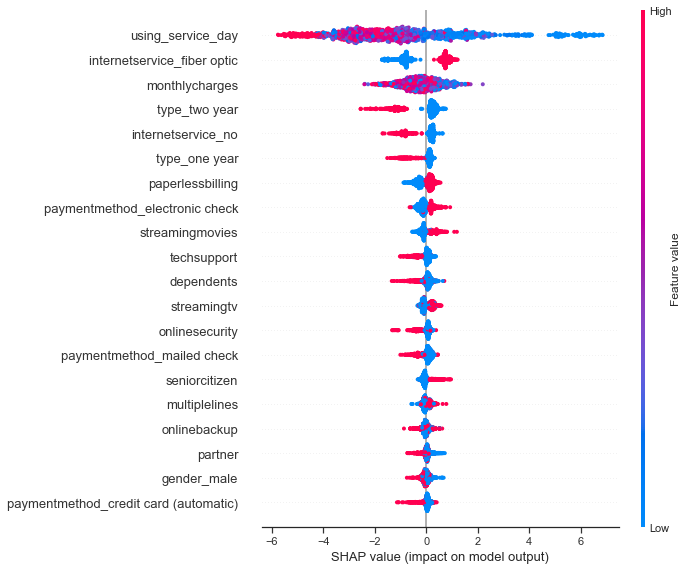

In [81]:
explainer = shap.TreeExplainer(cbc)
shap_values = explainer.shap_values(features_test)

shap.summary_plot(shap_values, features_test)


Результаты моделирования соответствует ожиданиям:  
- Чем меньше период использования услуг, тем выше вероятность ухода клиента.
- Чем выше сумма общего чека, тем меньше вероятность отказа от услуг.
- Чаще всего уходят клиенты с суммой ежемесячного чека выше среднего. 


###  **Проверка на адекватность**
    


 Для финальной модели проведем проверку на адекватность: создадим константную модель и сравним с нашей.
    


In [82]:
target_pred_constant = pd.Series([0]*len(target_valid))
target_pred_constant.value_counts()

0    1409
dtype: int64

In [83]:
print('AUC-ROC для константой модели:', roc_auc_score(target_valid, target_pred_constant))
print('Accuracy_score для константой модели:', accuracy_score(target_valid, target_pred_constant))

AUC-ROC для константой модели: 0.5
Accuracy_score для константой модели: 0.7260468417317246


 Финальная модель показывает результат лучше, чем константная, значит, ее можно считать адекватной.
    


### **Вывод**
    



 В данной работе мы провели предобработку данных, ислледовательский анализ данных и создали модель прогнозирования уйдет ли клиент к конкурентам или нет:
    
- объединие исходных данных, обработка ошибок, пропусков   
- введен дополнительный обучающий признак - количество дней активности абонента
- проведено исследование данных:
    - доля отказов клиентов, которые платят каждый месяц, примерно равная  
    - среди оплат сразу за год или за два - доля отказов минимальная  
    - наибольшая доля отказов связана с использованием до двух месяцев  
    - чем больше время пользования, тем меньше отказов
    - чем выше сумма общего чека, тем ниже вероятность отказа от услуг  
    - дополнительные услуги не оказывают значительное влияние на целевой показатель  
    - реже всего отказываются те, кто пользуется только телефоном
    - доля отказов среди пользователей DSL меньше, чем среди пользователей оптики 
- подготовлены данные для моделей
- скалирование (для числовых признаков), OHE (для категориальных)
- обучение RandomForrest, GradBoost, LightGBM, CatBoost 
- финальное тестирование, выбор лучшей модели, проверка на адекватность    
    Полученные результаты:
    
   | Название модели       | ROC_AUC          | Accuracy_score   |
| ------------- |:-------------:| -----:|
| RandomForrest | 0.86 | 0.81 |
| GradBoost    | 0.92 |  0.84 |
| LightGBM | 0.91 | 0.84 |
| **CatBoost** | **0.92** | **0.86** |

Лучше всего себя показали **CatBoost, ROC_AUC = 0.92**. 
    



    
**Рекомендации:**  
    
    
Клиента необходимо удержать в течение трех и более месяцев, вероятно, необходимо продумать какие-то специальные акции для новых клиентов.  
    
Сумма общего чека сильно влияет на вероятность отказа: увеличение суммы снижает вероятность. Во-первых, это подтверждает указанное выше. Во-вторых, в интересах компании удерживать клиентов, которые много платят. Может быть имеет смысл разделить клиентов на группы, предлагать им разные условия и проверить эмпирический риск в таком случае. 

Необходимо выяснить, с чем связаны такие частые отказы аудитории электронного чека. 
    
Стоить обратить внимание на качество интернета, так как клиенты чаще отказываются из-за него. 
    
Дополнительные услуги оказывают наименьшее влияние, но важно отметить, что они отчасти определяют суммарные затраты пользователя, которые влияют на отток, с ними также нужно работать. 
    
    


 📞 **Отчет.**
- **Какие пункты плана были выполнены, а какие — нет (поясните почему)?**  
Выполнены все пункты изначального плана.  
    
- **Какие трудности возникли и как вы их преодолели?**  
Не все решения были удачными: изначально добавила дополнительный признак - количество услуг. Однако, наличие этого признака снизило качество получаемых моделей. В итоге признак был удален. Дополнительно пришлось продумать scorer, подсчитывающий метрику roc_auc, необходимый для gridsearchCV.
    
- **Какие ключевые шаги в решении задачи выделили?**  
Работа с признаками: добавление новых, анализ и удаление не нужных. Работа с датами: необходимо было удалить сами даты, но оставить полезную информацию, которую они содержали в себе. Балансировка классов.
    
- **Какая ваша итоговая модель и какое у неё качество?**
    | Название модели       | ROC_AUC          | Accuracy_score   |
| ------------- |:-------------:| -----:|
| **CatBoost** | **0.92** | **0.86** |
